In [1]:
#!pip install --upgrade keras
!pip install keras_cv
!pip install keras==3.4.1
!pip install tensorflow==2.17.0

#!pip install --upgrade tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.1 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 3.3.3
    Uninstalling keras-3.3.3:
      Successfully uninstalled keras-3.3.3
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 601.3/601.3 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 92.3 MB/s eta 0:00:00
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
      Successfully uninstalled tensorboard-2.16.2
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.16.1
    Uninstalling tensorflow-2.16.1:
      Successfully uninstalled tensorflow-2.16.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.9.1 requires tensorflow~=2.16.1, but you have tensorflow 2.17.0 whi

In [2]:
# Set seed for reproducibility

seed = 69


# Import necessary libraries

import os

# Set environment variables before importing modules

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

os.environ['PYTHONHASHSEED'] = str(seed)

os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'


# Suppress warnings



import warnings



warnings.simplefilter(action='ignore', category=FutureWarning)



warnings.simplefilter(action='ignore', category=Warning)


# Import necessary modules



import logging



import random



import numpy as np


# Set seeds for random number generators in NumPy and Python



np.random.seed(seed)



random.seed(seed)







# Import TensorFlow and Keras



import tensorflow as tf



from tensorflow import keras as tfk



from tensorflow.keras import layers as tfkl











# Set seed for TensorFlow



tf.random.set_seed(seed)



tf.compat.v1.set_random_seed(seed)


# Reduce TensorFlow verbosity



tf.autograph.set_verbosity(0)



tf.get_logger().setLevel(logging.ERROR)



tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)







# Import other libraries



import pandas as pd



import seaborn as sns



import matplotlib.pyplot as plt



from sklearn.datasets import load_iris



from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix



from sklearn.model_selection import train_test_split





from tensorflow.keras import mixed_precision





# Configure plot display settings



sns.set(font_scale=1.4)



sns.set_style('white')



plt.rc('font', size=14)



%matplotlib inline

In [3]:
print(tfk.__version__)

print(tf.__version__)

3.4.1
2.17.0


In [4]:
import kagglehub



bloodcellscleaned_path = kagglehub.dataset_download('myke01/bloodcellscleaned')

In [5]:
dataset = np.load(bloodcellscleaned_path + '/cleaned_training_set.npz')



X = dataset['images']



y = dataset['labels']

In [6]:
## Augmentation
import keras_cv

augmentation_pipeline = tf.keras.Sequential([
    
    keras_cv.layers.ChannelShuffle(),
    keras_cv.layers.RandomFlip("horizontal_and_vertical"),
    keras_cv.layers.RandomCutout(0.6, 0.6),
    #0.77
    
    keras_cv.layers.RandomSaturation(0.7),
    #0.79

    tf.keras.layers.GaussianNoise(stddev=1),
    
    keras_cv.layers.AugMix(value_range =[0,255], severity=0.6, num_chains=5, chain_depth=[1, 4], alpha=1.0),
    keras_cv.layers.RandAugment(value_range=[0,255], rate = 10/11)
    #0.84
])

def applyAugmentation(inputs):
    inputs["images"] = augmentation_pipeline(inputs["images"])
    return inputs


I0000 00:00:1732397923.882180      23 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732397923.893096      23 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732397923.893312      23 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732397923.896248      23 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [7]:
#Import the InceptionV3 model



from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2M, preprocess_input

total = 11943
n_classes = 8.0

weight_for_s1 = (1 / 848) * (total / n_classes)
weight_for_s2 = (1 / 2177) * (total / n_classes)
weight_for_s3 = (1 / 1085) * (total / n_classes)
weight_for_s4 = (1 / 2020) * (total / n_classes)
weight_for_s5 = (1 / 849) * (total / n_classes)
weight_for_s6 = (1 / 991) * (total / n_classes)
weight_for_s7 = (1 / 2330) * (total / n_classes)
weight_for_s8 = (1 / 1643) * (total / n_classes)


class_weight = {0: weight_for_s1, 1: weight_for_s2, 2: weight_for_s3, 3: weight_for_s4,
                4: weight_for_s5, 5: weight_for_s6, 6: weight_for_s7, 7: weight_for_s8}

print('Weight for class 1: {:.2f}'.format(weight_for_s1))
print('Weight for class 2: {:.2f}'.format(weight_for_s2))
print('Weight for class 3: {:.2f}'.format(weight_for_s3))
print('Weight for class 4: {:.2f}'.format(weight_for_s4))
print('Weight for class 5: {:.2f}'.format(weight_for_s5))
print('Weight for class 6: {:.2f}'.format(weight_for_s6))
print('Weight for class 7: {:.2f}'.format(weight_for_s7))
print('Weight for class 8: {:.2f}'.format(weight_for_s8))








X_train, X_val, y_train, y_val = train_test_split(

    X,

    y,

    test_size=0.2,

    random_state=seed,

    stratify=y



)



# Normalize the images according to InceptionV3 requirements

X_train = preprocess_input(X_train)

X_val = preprocess_input(X_val)

X_tr_val = preprocess_input(X)

# Print the shapes of the resulting sets

print('Training set shape:\t', X_train.shape, y_train.shape)

print('Validation set shape:\t', X_val.shape, y_val.shape)

print('Training set range:\t', X_train.min(), X_train.max())




Weight for class 1: 1.76
Weight for class 2: 0.69
Weight for class 3: 1.38
Weight for class 4: 0.74
Weight for class 5: 1.76
Weight for class 6: 1.51
Weight for class 7: 0.64
Weight for class 8: 0.91
Training set shape:	 (9554, 96, 96, 3) (9554, 1)
Validation set shape:	 (2389, 96, 96, 3) (2389, 1)
Training set range:	 0 255


In [8]:
# One-hot encoding of targets

y = tfk.utils.to_categorical(y, num_classes=8)

y_train = tfk.utils.to_categorical(y_train, num_classes=8)

y_val = tfk.utils.to_categorical(y_val, num_classes=8)

print(y.shape)

(11943, 8)


In [9]:
#X_aug = augmentation_pipeline(X)
#y = dataset['labels']

# Save with compression
#np.savez_compressed('dataset_augmented.npz', images=X_aug, labels=y)


In [10]:
cut_mix = keras_cv.layers.CutMix()
mix_up = keras_cv.layers.MixUp()


def cut_mix_and_mix_up(samples):
    samples = cut_mix(samples, training=True)
    samples = mix_up(samples, training=True)
    return samples


In [11]:
# Constants
BATCH_SIZE = 128
AUTOTUNE = tf.data.AUTOTUNE

# Replace these paths or arrays with your data
data = {
    "train": {"images": X_train, "labels": y_train},  # NumPy arrays
    "test": {"images": X_val, "labels": y_val},     # NumPy arrays
}

# Dynamically determine the number of classes from the dataset
num_classes = 8

def preprocess_for_model(inputs):
    images, labels = inputs["images"], inputs["labels"]
    images = tf.cast(images, tf.float32)
    return images, labels

# Function to preprocess a single image and label
def to_dict(image, label):
    image = tf.cast(image, tf.float32)
    label = tf.cast(label, tf.float32)
    return {"images": image, "labels": label}


# Prepare dataset with shuffling and batching
def prepare_dataset(dataset, split):
    if split == "train":
        return (
            dataset.shuffle(10 * BATCH_SIZE)  # Shuffle the dataset
            .map(to_dict, num_parallel_calls=AUTOTUNE)  # Preprocess images and labels
            .batch(BATCH_SIZE)  # Batch the dataset
            .prefetch(AUTOTUNE)  # Prefetch for performance
        )
    elif split == "test":
        return (
            dataset.map(to_dict, num_parallel_calls=AUTOTUNE)  # Preprocess images and labels
            .batch(BATCH_SIZE)  # Batch the dataset
            .prefetch(AUTOTUNE)  # Prefetch for performance
        )


# Function to load and prepare the dataset
def load_dataset(split="train"):
    # Convert NumPy data to TensorFlow Dataset
    dataset = tf.data.Dataset.from_tensor_slices(
        (data[split]["images"], data[split]["labels"])
    )
    return prepare_dataset(dataset, split)

# Load train and test datasets


train_dataset_augmented = (
    load_dataset()
    .map(applyAugmentation, num_parallel_calls=AUTOTUNE)
    .map(cut_mix_and_mix_up, num_parallel_calls=AUTOTUNE)
)

test_dataset_augmented = (
    load_dataset(split="test")
    .map(applyAugmentation, num_parallel_calls=AUTOTUNE)
    .map(cut_mix_and_mix_up, num_parallel_calls=AUTOTUNE)
)

train_dataset_augmented = train_dataset_augmented.prefetch(AUTOTUNE)
test_dataset_augmented = test_dataset_augmented.prefetch(AUTOTUNE)

train_dataset = load_dataset()
test_dataset = load_dataset(split="test")

train_dataset = train_dataset.prefetch(AUTOTUNE)
test_dataset = test_dataset.prefetch(AUTOTUNE)

test_dataset = test_dataset.map(preprocess_for_model, num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.map(preprocess_for_model, num_parallel_calls=AUTOTUNE)

train_dataset_augmented = train_dataset_augmented.map(preprocess_for_model, num_parallel_calls=AUTOTUNE)
test_dataset_augmented = test_dataset_augmented.map(preprocess_for_model, num_parallel_calls=AUTOTUNE)

# Concatenate the original and augmented training datasets
combined_train_dataset = train_dataset.concatenate(train_dataset_augmented)

# If needed, also concatenate the test datasets
combined_test_dataset = test_dataset.concatenate(test_dataset_augmented)

# Prefetch for performance
combined_train_dataset = combined_train_dataset.prefetch(AUTOTUNE)
combined_test_dataset = combined_test_dataset.prefetch(AUTOTUNE)

In [12]:
epochs = 1000

batch_size =128

learning_rate = .001

214201816/214201816 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "efficientnetv2-m"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        648 │ rescaling[0][0]   │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │         96 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      5,184 │ stem_activation[… │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │         96 │ block1a_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 112, 112,  │          0 │ block1a_project_… │
│                     │ 24)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 112, 112,  │      5,184 │ block1a_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 112, 112,  │         96 │ block1b_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 112, 112,  │          0 │ block1b_project_… │
│ (Dropout)           │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 112, 112,  │          0 │ block1b_drop[0][… │
│                     │ 24)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_co… │ (None, 112, 112,  │      5,184 │ block1b_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_bn  │ (None, 112, 112,  │         96 │ block1c_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1c_project_ac… │ (None, 112, 112,  │          0 │ block1c_project_

 Total params: 53,150,388 (202.75 MB)

 Trainable params: 52,858,356 (201.64 MB)

 Non-trainable params: 292,032 (1.11 MB)

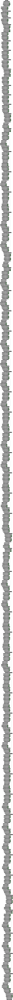

In [13]:
from tensorflow.keras.models import load_model

# Initialise EfficientNetV2M model with pretrained weights, for transfer learning



mobilenet = tfk.applications.EfficientNetV2M(

    input_shape=(224,224, 3),

    include_top=False,

    weights="imagenet",

    pooling='avg',

)



# Display a summary of the model architecture

mobilenet.summary(expand_nested=True)



# Display model architecture with layer shapes and trainable parameters

tfk.utils.plot_model(mobilenet, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ keras_tensor_749CLONE           │ (None, 96, 96, 3)      │             0 │
│ (InputLayer)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resizing (Resizing)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-m (Functional)   │ (None, 1280)           │    53,150,388 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ input_layer_1 (InputLayer) │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ rescaling (Rescaling)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_conv (Conv2D)         │ (None, 112, 112, 24)   │           648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_bn                    │ (None, 112, 112, 24)   │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_activation            │ (None, 112, 112, 24)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_conv       │ (None, 112, 112, 24)   │         5,184 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_bn         │ (None, 112, 112, 24)   │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_activation │ (None, 112, 112, 24)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_add (Add)          │ (None, 112, 112, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_conv       │ (None, 112, 112, 24)   │         5,184 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_bn         │ (None, 112, 112, 24)   │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_activation │ (None, 112, 112, 24)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_drop (Dropout)     │ (None, 112, 112, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_add (Add)          │ (None, 112, 112, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1c_project_conv       │ (None, 112, 112, 24)   │         5,184 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1c_project_bn         │ (None, 112, 112, 24)   │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 53,160,636 (202.79 MB)

 Trainable params: 10,248 (40.03 KB)

 Non-trainable params: 53,150,388 (202.75 MB)

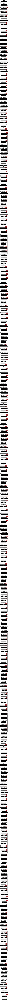

In [14]:
# Freeze all layers in EfficientNetV2M to use it solely as a feature extractor

mobilenet.trainable = False

# Create an input layer with shape (224, 224, 3)



inputs = tfk.Input(shape=(96, 96, 3), name='input_layer')

inputs = augmentation_pipeline(inputs)

x = tfkl.Resizing(224, 224, interpolation="nearest")(inputs)


# Connect InceptionV3 to the input

x = mobilenet(x)


x = tfkl.Dropout(0.5, name='dropout')(x)


# Add a Dense layer with 8 units and softmax activation as the classifier
outputs = tfkl.Dense(y_train.shape[-1], activation='softmax', name='dense')(x)

# Create a Model connecting input and output
model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

# Compile the model with Categorical Cross-Entropy loss and Lion optimizer
model.compile(loss=tfk.losses.CategoricalCrossentropy(label_smoothing=0.1), optimizer=tfk.optimizers.Lion(learning_rate = 0.0001), metrics=['accuracy'])


# Display a summary of the model architecture
model.summary(expand_nested=True)



# Display model architecture with layer shapes and trainable parameters



tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [15]:
print(combined_train_dataset.element_spec)

(TensorSpec(shape=(None, 96, 96, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.float32, name=None))


In [16]:
# Train the model



history = model.fit(
    train_dataset_augmented,
    epochs = 200,

    validation_data = test_dataset,

    class_weight = class_weight,

    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=15, restore_best_weights=True)]



).history


# Calculate and print the final validation accuracy

final_val_accuracy = round(max(history['val_accuracy'])* 100, 2)

print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename

model_filename = 'final_myke_V2M.keras'

model.save(model_filename)

# Delete the model to free up resources

del model

Epoch 1/200


I0000 00:00:1732397984.160605      79 service.cc:146] XLA service 0x7b02c0002470 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732397984.160669      79 service.cc:154]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1732398030.217923      79 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


75/75 ━━━━━━━━━━━━━━━━━━━━ 257s 2s/step - accuracy: 0.1405 - loss: 2.1387 - val_accuracy: 0.1507 - val_loss: 2.0234
Epoch 2/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 149s 2s/step - accuracy: 0.1764 - loss: 2.1262 - val_accuracy: 0.2704 - val_loss: 1.9763
Epoch 3/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 150s 2s/step - accuracy: 0.1909 - loss: 2.0648 - val_accuracy: 0.3638 - val_loss: 1.9098
Epoch 4/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 148s 2s/step - accuracy: 0.2195 - loss: 2.0343 - val_accuracy: 0.3889 - val_loss: 1.8674
Epoch 5/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 149s 2s/step - accuracy: 0.2303 - loss: 2.0342 - val_accuracy: 0.4307 - val_loss: 1.8272
Epoch 6/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.2404 - loss: 2.0342 - val_accuracy: 0.4759 - val_loss: 1.7888
Epoch 7/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 149s 2s/step - accuracy: 0.2467 - loss: 2.0005 - val_accuracy: 0.5107 - val_loss: 1.7742
Epoch 8/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step - accuracy: 0.2500 - loss: 1.9987 - val_accuracy: 0.5266 - val_l

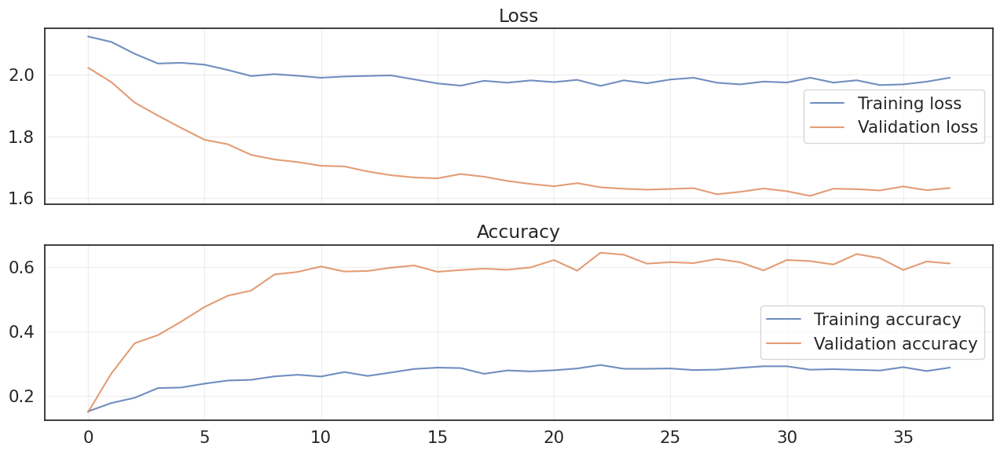

In [17]:
# Create a figure with two vertically stacked subplots

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(15, 6), sharex=True)



# Plot training and validation loss

ax1.plot(history['loss'], label='Training loss', alpha=.8)

ax1.plot(history['val_loss'], label='Validation loss', alpha=.8)

ax1.set_title('Loss')

ax1.legend()

ax1.grid(alpha=.3)



# Plot training and validation accuracy

ax2.plot(history['accuracy'], label='Training accuracy', alpha=.8)

ax2.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)

ax2.set_title('Accuracy')

ax2.legend()

ax2.grid(alpha=.3)



# Adjust the layout and display the plot

plt.tight_layout()

plt.subplots_adjust(right=0.85)

plt.show()


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ keras_tensor_749CLONE           │ (None, 96, 96, 3)      │             0 │
│ (InputLayer)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resizing (Resizing)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-m (Functional)   │ (None, 1280)           │    53,150,388 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ input_layer_1 (InputLayer) │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ rescaling (Rescaling)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_conv (Conv2D)         │ (None, 112, 112, 24)   │           648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_bn                    │ (None, 112, 112, 24)   │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_activation            │ (None, 112, 112, 24)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_conv       │ (None, 112, 112, 24)   │         5,184 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_bn         │ (None, 112, 112, 24)   │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_activation │ (None, 112, 112, 24)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_add (Add)          │ (None, 112, 112, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_conv       │ (None, 112, 112, 24)   │         5,184 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_bn         │ (None, 112, 112, 24)   │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_activation │ (None, 112, 112, 24)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_drop (Dropout)     │ (None, 112, 112, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_add (Add)          │ (None, 112, 112, 24)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1c_project_conv       │ (None, 112, 112, 24)   │         5,184 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1c_project_bn         │ (None, 112, 112, 24)   │            96 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 53,170,886 (202.83 MB)

 Trainable params: 10,248 (40.03 KB)

 Non-trainable params: 53,150,388 (202.75 MB)

 Optimizer params: 10,250 (40.04 KB)

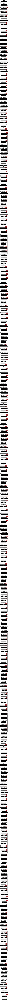

In [18]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('/kaggle/working/final_myke_V2M.keras')



# Display a summary of the model architecture

ft_model.summary(expand_nested=True)



# Display model architecture with layer shapes and trainable parameters

tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

TRAIN:
Accuracy score over the train set: 0.6405
Precision score over the train set: 0.6513
Recall score over the train set: 0.6405
F1 score over the train set: 0.6288


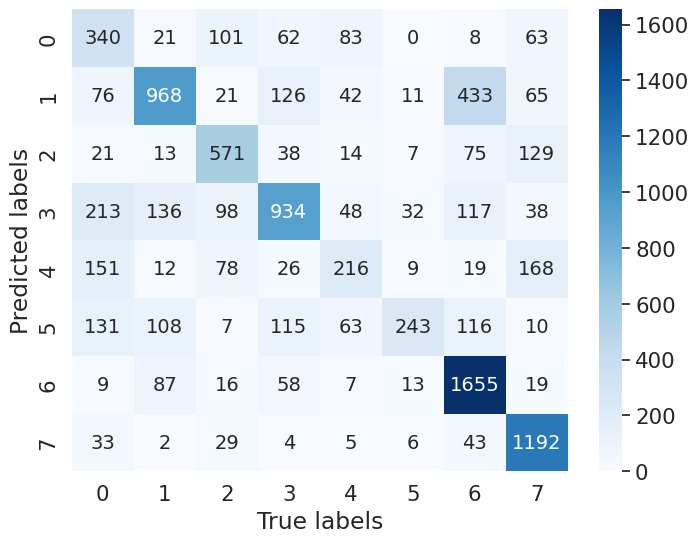

VALIDATION:
Accuracy score over the validation set: 0.6438
Precision score over the validation set: 0.6579
Recall score over the validation set: 0.6438
F1 score over the validation set: 0.6332


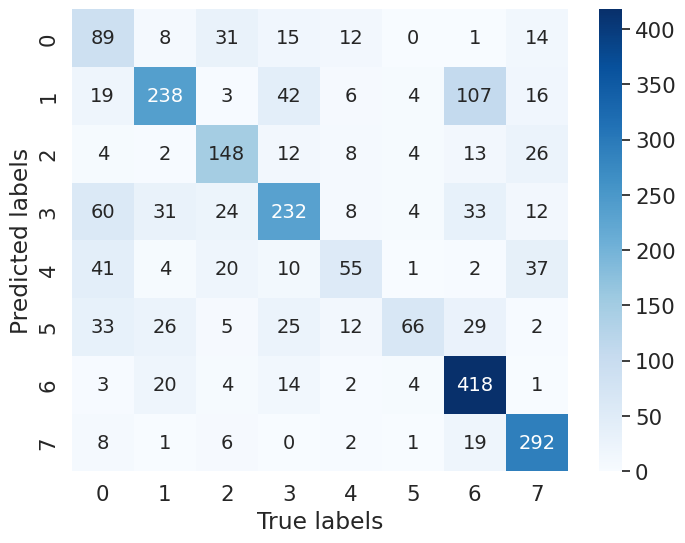

In [19]:
print("TRAIN:")

# Predict class probabilities and get predicted classes

train_predictions = ft_model.predict(X_train, verbose=0)

train_predictions = np.argmax(train_predictions, axis=-1)



# Extract ground truth classes

train_gt = np.argmax(y_train, axis=-1)



# Calculate and display training set accuracy

train_accuracy = accuracy_score(train_gt, train_predictions)

print(f'Accuracy score over the train set: {round(train_accuracy, 4)}')



# Calculate and display training set precision

train_precision = precision_score(train_gt, train_predictions, average='weighted')

print(f'Precision score over the train set: {round(train_precision, 4)}')



# Calculate and display training set recall

train_recall = recall_score(train_gt, train_predictions, average='weighted')

print(f'Recall score over the train set: {round(train_recall, 4)}')



# Calculate and display training set F1 score

train_f1 = f1_score(train_gt, train_predictions, average='weighted')

print(f'F1 score over the train set: {round(train_f1, 4)}')



# Compute the confusion matrix

cm = confusion_matrix(train_gt, train_predictions)



# Create labels combining confusion matrix values

labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)



# Plot the confusion matrix with class labels

plt.figure(figsize=(8, 6))

sns.heatmap(cm, annot=labels, fmt='',   cmap='Blues')

plt.xlabel('True labels')

plt.ylabel('Predicted labels')

plt.show()



print("VALIDATION:")

# Predict class probabilities and get predicted classes

val_predictions = ft_model.predict(X_val, verbose=0)

val_predictions = np.argmax(val_predictions, axis=-1)



# Extract ground truth classes

val_gt = np.argmax(y_val, axis=-1)



# Calculate and display validation set accuracy

val_accuracy = accuracy_score(val_gt, val_predictions)

print(f'Accuracy score over the validation set: {round(val_accuracy, 4)}')



# Calculate and display validation set precision

val_precision = precision_score(val_gt, val_predictions, average='weighted')

print(f'Precision score over the validation set: {round(val_precision, 4)}')



# Calculate and display validation set recall

val_recall = recall_score(val_gt, val_predictions, average='weighted')

print(f'Recall score over the validation set: {round(val_recall, 4)}')



# Calculate and display validation set F1 score

val_f1 = f1_score(val_gt, val_predictions, average='weighted')

print(f'F1 score over the validation set: {round(val_f1, 4)}')



# Compute the confusion matrix

cm = confusion_matrix(val_gt, val_predictions)



# Create labels combining confusion matrix values

labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)



# Plot the confusion matrix with class labels

plt.figure(figsize=(8, 6))

sns.heatmap(cm, annot=labels, fmt='',   cmap='Blues')

plt.xlabel('True labels')

plt.ylabel('Predicted labels')

plt.show()


In [20]:
# Set the EfficientNetV2S model layers as trainable

ft_model.get_layer('efficientnetv2-m').trainable = True



# Set all EfficientNetV2S layers as non-trainable

for layer in ft_model.get_layer('efficientnetv2-m').layers:

    layer.trainable = False



# Enable training only for Conv2D layers

for i, layer in enumerate(ft_model.get_layer('efficientnetv2-m').layers):

    if isinstance(layer, tf.keras.layers.Conv2D) :

        layer.trainable = True

        print(i, layer.name, type(layer).__name__, layer.trainable)

2 stem_conv Conv2D True
5 block1a_project_conv Conv2D True
9 block1b_project_conv Conv2D True
14 block1c_project_conv Conv2D True
19 block2a_expand_conv Conv2D True
22 block2a_project_conv Conv2D True
24 block2b_expand_conv Conv2D True
27 block2b_project_conv Conv2D True
31 block2c_expand_conv Conv2D True
34 block2c_project_conv Conv2D True
38 block2d_expand_conv Conv2D True
41 block2d_project_conv Conv2D True
45 block2e_expand_conv Conv2D True
48 block2e_project_conv Conv2D True
52 block3a_expand_conv Conv2D True
55 block3a_project_conv Conv2D True
57 block3b_expand_conv Conv2D True
60 block3b_project_conv Conv2D True
64 block3c_expand_conv Conv2D True
67 block3c_project_conv Conv2D True
71 block3d_expand_conv Conv2D True
74 block3d_project_conv Conv2D True
78 block3e_expand_conv Conv2D True
81 block3e_project_conv Conv2D True
85 block4a_expand_conv Conv2D True
93 block4a_se_reduce Conv2D True
94 block4a_se_expand Conv2D True
96 block4a_project_conv Conv2D True
98 block4b_expand_conv 

In [21]:
# Set the number of layers to freeze

N = 150



# Set the first N layers as non-trainable

for i, layer in enumerate(ft_model.get_layer('efficientnetv2-m').layers[:N]):

    layer.trainable = False



In [22]:
# Compile the model

ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(label_smoothing=0.1), optimizer=tfk.optimizers.Adam(learning_rate=0.0001), metrics=['accuracy'])

In [23]:
# Fine-tune the model



ft_history = ft_model.fit(
    train_dataset_augmented,
    epochs = 200,
    validation_data = test_dataset,
    class_weight = class_weight,
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=15, restore_best_weights=True)]



).history





# Calculate and print the final validation accuracy

final_val_accuracy = round(max(ft_history['val_accuracy'])* 100, 2)

print(f'Final validation accuracy: {final_val_accuracy}%')



# Save the trained model to a file with the accuracy included in the filename

model_filename = '/kaggle/working/final_myke_FT_V2M.keras'

ft_model.save(model_filename)



# Delete the model to free up resources

del ft_model

Epoch 1/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 319s 3s/step - accuracy: 0.3356 - loss: 1.9065 - val_accuracy: 0.7740 - val_loss: 0.9966
Epoch 2/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 176s 2s/step - accuracy: 0.4840 - loss: 1.7340 - val_accuracy: 0.8263 - val_loss: 0.8334
Epoch 3/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 179s 2s/step - accuracy: 0.5301 - loss: 1.6737 - val_accuracy: 0.8443 - val_loss: 0.7811
Epoch 4/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 179s 2s/step - accuracy: 0.5520 - loss: 1.6093 - val_accuracy: 0.9263 - val_loss: 0.6555
Epoch 5/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.5780 - loss: 1.5657 - val_accuracy: 0.9293 - val_loss: 0.6295
Epoch 6/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 177s 2s/step - accuracy: 0.5831 - loss: 1.5661 - val_accuracy: 0.9297 - val_loss: 0.6305
Epoch 7/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.6002 - loss: 1.5343 - val_accuracy: 0.9016 - val_loss: 0.6663
Epoch 8/200
75/75 ━━━━━━━━━━━━━━━━━━━━ 176s 2s/step - accuracy: 0.6061 - loss: 1.5372 - val_accuracy: 0.

In [24]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('/kaggle/input/finalv2m/keras/default/1/final_myke_FT_V2M.keras')


TRAIN + VAL :
Accuracy score over the train set: 0.9817
Precision score over the train set: 0.982
Recall score over the train set: 0.9817
F1 score over the train set: 0.9816


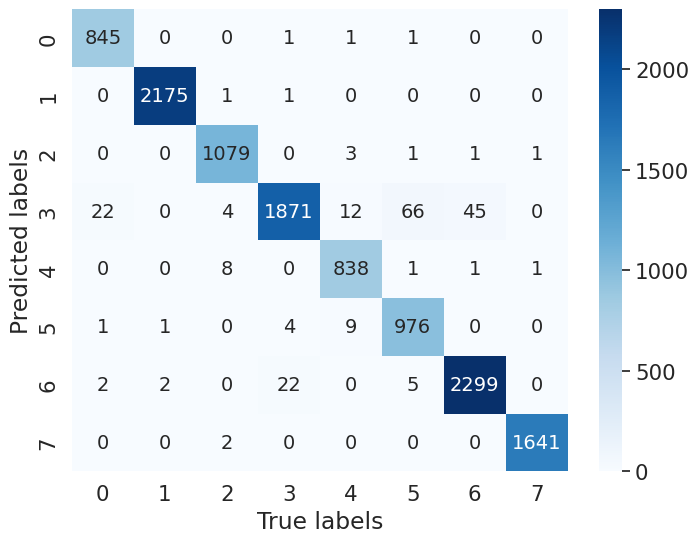

FULL AUGMENTED : 
Accuracy score over the train set: 0.7212
Precision score over the train set: 0.7238
Recall score over the train set: 0.7212
F1 score over the train set: 0.7206


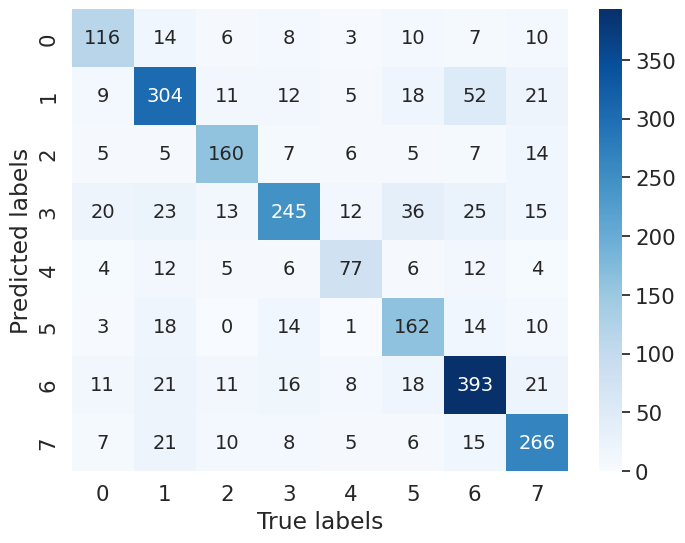

Accuracy score over the train set: 0.7067
Precision score over the train set: 0.7101
Recall score over the train set: 0.7067
F1 score over the train set: 0.7049


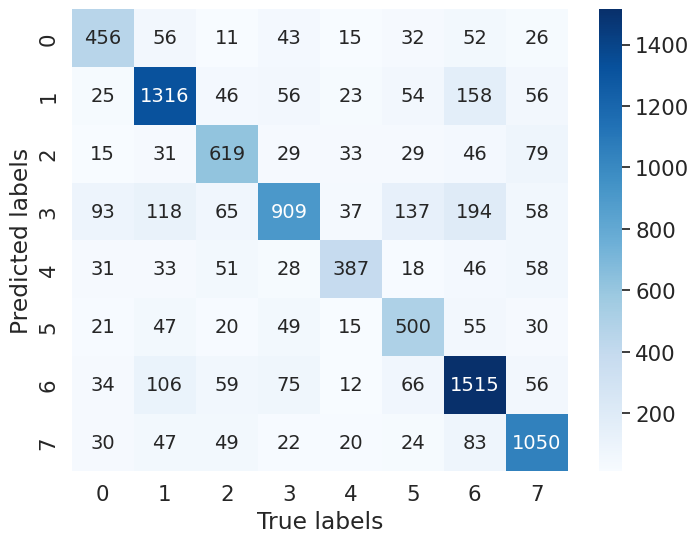

In [25]:
print("TRAIN + VAL :")

# Predict class probabilities and get predicted classes

train_predictions = ft_model.predict(X, verbose=0)

train_predictions = np.argmax(train_predictions, axis=-1)



# Extract ground truth classes

train_gt = np.argmax(y, axis=-1)



# Calculate and display training set accuracy

train_accuracy = accuracy_score(train_gt, train_predictions)

print(f'Accuracy score over the train set: {round(train_accuracy, 4)}')



# Calculate and display training set precision

train_precision = precision_score(train_gt, train_predictions, average='weighted')

print(f'Precision score over the train set: {round(train_precision, 4)}')



# Calculate and display training set recall

train_recall = recall_score(train_gt, train_predictions, average='weighted')

print(f'Recall score over the train set: {round(train_recall, 4)}')



# Calculate and display training set F1 score

train_f1 = f1_score(train_gt, train_predictions, average='weighted')

print(f'F1 score over the train set: {round(train_f1, 4)}')



# Compute the confusion matrix

cm = confusion_matrix(train_gt, train_predictions)



# Create labels combining confusion matrix values

labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)



# Plot the confusion matrix with class labels

plt.figure(figsize=(8, 6))

sns.heatmap(cm, annot=labels, fmt='',   cmap='Blues')

plt.xlabel('True labels')

plt.ylabel('Predicted labels')

plt.show()

print("FULL AUGMENTED : ")

# Combine all batches into a single batch
combined_dataset = test_dataset_augmented.unbatch().batch(total)

# Extract the entire dataset in one go
for full_batch in combined_dataset.take(1):
    X_aug = full_batch[0]
    y_aug = full_batch[1]
    # Predict on the entire dataset
    train_predictions = ft_model.predict(X_aug, verbose=0)
    train_predictions = np.argmax(train_predictions, axis=-1)

    # Extract ground truth classes

    train_gt = np.argmax(y_aug, axis=-1)



    # Calculate and display training set accuracy

    train_accuracy = accuracy_score(train_gt, train_predictions)

    print(f'Accuracy score over the train set: {round(train_accuracy, 4)}')



    # Calculate and display training set precision

    train_precision = precision_score(train_gt, train_predictions, average='weighted')

    print(f'Precision score over the train set: {round(train_precision, 4)}')



    # Calculate and display training set recall

    train_recall = recall_score(train_gt, train_predictions, average='weighted')

    print(f'Recall score over the train set: {round(train_recall, 4)}')



    # Calculate and display training set F1 score

    train_f1 = f1_score(train_gt, train_predictions, average='weighted')

    print(f'F1 score over the train set: {round(train_f1, 4)}')



    # Compute the confusion matrix

    cm = confusion_matrix(train_gt, train_predictions)



    # Create labels combining confusion matrix values

    labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)



    # Plot the confusion matrix with class labels

    plt.figure(figsize=(8, 6))

    sns.heatmap(cm, annot=labels, fmt='',   cmap='Blues')

    plt.xlabel('True labels')

    plt.ylabel('Predicted labels')

    plt.show()

    
# Combine all batches into a single batch
combined_dataset = train_dataset_augmented.unbatch().batch(total)

# Extract the entire dataset in one go
for full_batch in combined_dataset.take(1):
    X_aug = full_batch[0]
    y_aug = full_batch[1]
    # Predict on the entire dataset
    train_predictions = ft_model.predict(X_aug, verbose=0)
    train_predictions = np.argmax(train_predictions, axis=-1)

    # Extract ground truth classes

    train_gt = np.argmax(y_aug, axis=-1)



    # Calculate and display training set accuracy

    train_accuracy = accuracy_score(train_gt, train_predictions)

    print(f'Accuracy score over the train set: {round(train_accuracy, 4)}')



    # Calculate and display training set precision

    train_precision = precision_score(train_gt, train_predictions, average='weighted')

    print(f'Precision score over the train set: {round(train_precision, 4)}')



    # Calculate and display training set recall

    train_recall = recall_score(train_gt, train_predictions, average='weighted')

    print(f'Recall score over the train set: {round(train_recall, 4)}')



    # Calculate and display training set F1 score

    train_f1 = f1_score(train_gt, train_predictions, average='weighted')

    print(f'F1 score over the train set: {round(train_f1, 4)}')



    # Compute the confusion matrix

    cm = confusion_matrix(train_gt, train_predictions)



    # Create labels combining confusion matrix values

    labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)



    # Plot the confusion matrix with class labels

    plt.figure(figsize=(8, 6))

    sns.heatmap(cm, annot=labels, fmt='',   cmap='Blues')

    plt.xlabel('True labels')

    plt.ylabel('Predicted labels')

    plt.show()




In [26]:
%%writefile model.py

import numpy as np



import tensorflow as tf

from tensorflow import keras as tfk

from tensorflow.keras import layers as tfkl



import numpy as np





class Model:

    def __init__(self):

        """

        Initialize the internal state of the model. Note that the __init__

        method cannot accept any arguments.



        The following is an example loading the weights of a pre-trained

        model.

        """

        self.neural_network = tfk.models.load_model('final_myke_FT_V2M.keras')



    def predict(self, X):

        """

        Predict the labels corresponding to the input X. Note that X is a numpy

        array of shape (n_samples, 96, 96, 3) and the output should be a numpy

        array of shape (n_samples,). Therefore, outputs must no be one-hot

        encoded.



        The following is an example of a prediction from the pre-trained model

        loaded in the __init__ method.

        """

        X = tfk.applications.efficientnet_v2.preprocess_input(X)

        preds = self.neural_network.predict(X)

        if len(preds.shape) == 2:

            preds = np.argmax(preds, axis=1)

        return preds

Writing model.py


In [27]:
from datetime import datetime

filename = f'submission_EFFTFFT_moreaugm{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'



# Add files to the zip command if needed

!zip {filename} model.py final_myke_FT_V2M.keras


  adding: model.py (deflated 56%)
  adding: final_myke_FT_V2M.keras (deflated 7%)
